# NN autoencoder on Frame Spectrum data 
## tanh
## no-bias
## z-normalized

Taken from https://github.com/aymericdamien/TensorFlow-Examples/blob/master/examples/3_NeuralNetworks/autoencoder.py


In [104]:
from __future__ import division, print_function, absolute_import
%matplotlib notebook
from numpy import *
import wget
from scipy.io import wavfile
import librosa
import tensorflow as tf
import numpy as np
import os
from utils import *

import matplotlib.pyplot as plt
from matplotlib.pyplot import *
from ipywidgets import interact, interactive, fixed

plt.style.use('ggplot')


In [105]:
path = "../wavs/"
fname = 'Stockhausen_Kontakte.wav'
fname = 'mipais.wav'

filename = path+fname

In [179]:
from scipy.signal import resample
# Read wav file to floating values
fs_orig,x = wavfile.read(filename)
fs = 22050
x = resample(x, x.size*fs/fs_orig)

t1 = 2*fs
t2 = 300*fs
x = x[t1:t2]
x = np.float64(x)/2**15
# Peak Normalization

x/=abs(x).max()

# Extract overlapping frames and create a spectrogram in each one

L = x.size

frame_size = 2**16
step_size = int(frame_size/2)

# Number of frames
# n_frames = int( (L-frame_size)/step_size+1 )

block_size = 2**10
hop = int(block_size/4)
NFFT = block_size

level_threshold = 1e-4

# n_blocks = int( (frame_size-block_size)/hop)+1+ int(block_size/hop)

#STFT or CQT
representation = ['STFT','CQT'][0]
units = ['lineal','db'][1]

if representation=='STFT':
    # STFT
    
    S = abs(librosa.stft(x,n_fft=NFFT,hop_length=hop,win_length=block_size )/2/NFFT)
        

elif representation=='CQT':
    # CQT
    n_bins = 84
    
    S = abs(librosa.cqt(x,sr=fs,hop_length=hop,fmin=40.0,n_bins=n_bins,real=False))
        

if units=='db':
    S = 20*log10(abs(S)).clip(-60,0)

S = (S - S.min(0)) /(S.max(0) - S.min(0))

print("Dimensions: frames, freq bins, time bins")
S = np.array(S)
freq_bins, batch_length = S.shape
print(batch_length, freq_bins)


/usr/local/lib/python3.4/dist-packages/scipy/signal/signaltools.py:1889: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  Y = zeros(newshape, 'D')


Dimensions: frames, freq bins, time bins
11771 513


<IPython.core.display.Javascript object>


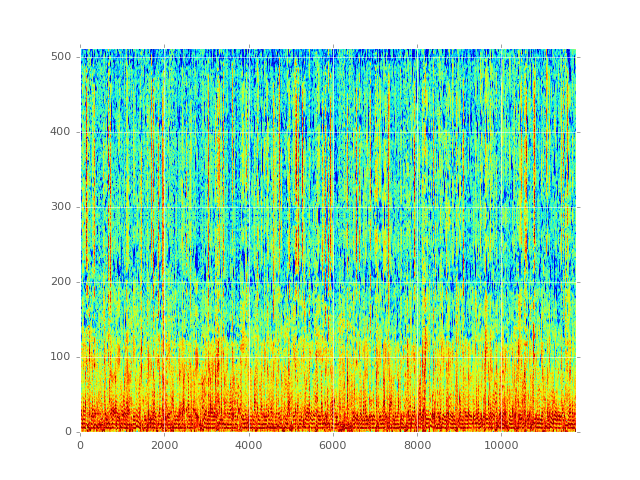

In [180]:
figure(figsize=(8,6))
imshow(S,aspect='auto',origin=0.0)

import IPython
IPython.display.Audio(data=x,rate=fs)


(11771, 513)
(513, 11771)


<IPython.core.display.Javascript object>


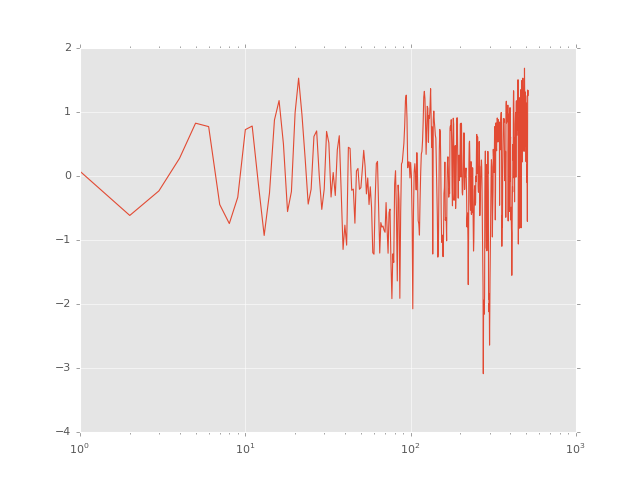

In [193]:
from utils import Data

Sn = S.copy()
Smean = S.mean(1)
Sn = S.T - Smean
Sd = Sn.std(0)
Sn = Sn/Sd

data = Data( Sn )
n_spectrums = data.length
print(Sn.shape)
print(S.shape)
figure()
semilogx(Sn[100])


In [182]:
print(data.data.shape)
data.next_batch(10).shape


(11771, 513)


(10, 513)

In [215]:
# Parameters
learning_rate = 0.01
training_epochs = 100
batch_size = 2**11

display_step = 5

# Network Parameters
dimensions= [256,128,64,32,16,8,4,2]
dimensions= [256,128,64,32,16,8,4,2]

n_input = data.data.shape[1]

In [216]:
# tf Graph input (only pictures)
X = tf.placeholder("float", [None, n_input])

weights = {}
biases = {}
layer_input = n_input

for layer_i, layer_output in enumerate(dimensions[:]):
    weights['encoder_h'+str(layer_i)] = tf.Variable(tf.random_normal([layer_input, layer_output]))
#     biases['encoder_b'+str(layer_i)] = tf.Variable(tf.random_normal([layer_output]))
    layer_input = layer_output

for layer_i, layer_output in enumerate(dimensions[:-1][::-1]+[n_input]):
    weights['decoder_h'+str(layer_i)] = tf.Variable(tf.random_normal([layer_input, layer_output]))
#     biases['decoder_b'+str(layer_i)] = tf.Variable(tf.random_normal([layer_output]))
    layer_input = layer_output
    
shape = tf.nn.tanh

# Building the encoder
layers = {}
def encoder(x):
    # Encoder Hidden layer with sigmoid activation #1
    layer_input = x
    
    for layer_i, layer_output in enumerate(dimensions[:]):
#         layers[layer_i] = shape(tf.add(tf.matmul(layer_input, weights['encoder_h'+str(layer_i)]), 
#                                                biases['encoder_b'+str(layer_i)]))
        
        layers[layer_i] = shape(tf.matmul(layer_input, weights['encoder_h'+str(layer_i)])) 

        layer_input = layers[layer_i]

    return layer_input


# Building the decoder
def decoder(x):

    layer_input = x
    for layer_i, layer_output in enumerate(dimensions[:]):
#         layers[layer_i] = shape(tf.add(tf.matmul(layer_input, weights['decoder_h'+str(layer_i)]), 
#                                                biases['decoder_b'+str(layer_i)]))
        layers[layer_i] = shape(tf.matmul(layer_input, weights['decoder_h'+str(layer_i)]))
        
        layer_input = layers[layer_i]

    return layer_input

# Construct model
encoder_op = encoder(X)
decoder_op = decoder(encoder_op)

# Prediction
y_pred = decoder_op
# Targets (Labels) are the input data.
y_true = X

# Define loss and optimizer, minimize the squared error
cost = tf.reduce_mean(tf.pow(y_true - y_pred, 2)) + 0.0*tf.reduce_mean(tf.pow(y_pred, 2)) 
optimizer = tf.train.AdamOptimizer(learning_rate).minimize(cost)

# Initializing the variables
init = tf.initialize_all_variables()

In [217]:
# Launch the graph
config = tf.ConfigProto( device_count = {'GPU': 0} )
sess = tf.Session(config=config)
sess.run(init)
total_batch = int(data.length/batch_size)
# Training cycle
for epoch in range(training_epochs):
    # Loop over all batches
    for i in range(total_batch):
        batch_xs = data.next_batch(batch_size)
        # Run optimization op (backprop) and cost op (to get loss value)
        opt,cost_value = sess.run([optimizer, cost], feed_dict={X: batch_xs})

    # Display logs per epoch step
    if epoch % display_step == 0:
        print("Epoch:", '%04d' % (epoch+1),"cost=", "{:.9f}".format(cost_value))

print("Optimization Finished!")

Epoch: 0001 cost= 1.901314855
Epoch: 0006 cost= 1.521034479
Epoch: 0011 cost= 1.352230310
Epoch: 0016 cost= 1.289377093
Epoch: 0021 cost= 1.284690619
Epoch: 0026 cost= 1.273302555
Epoch: 0031 cost= 1.247816324
Epoch: 0036 cost= 1.275983930
Epoch: 0041 cost= 1.264678001
Epoch: 0046 cost= 1.263276339
Epoch: 0051 cost= 1.256847858
Epoch: 0056 cost= 1.266957283
Epoch: 0061 cost= 1.261998773
Epoch: 0066 cost= 1.252072930
Epoch: 0071 cost= 1.250484943
Epoch: 0076 cost= 1.261137724
Epoch: 0081 cost= 1.253863096
Epoch: 0086 cost= 1.273156285
Epoch: 0091 cost= 1.258393288
Epoch: 0096 cost= 1.271083474
Optimization Finished!


<IPython.core.display.Javascript object>


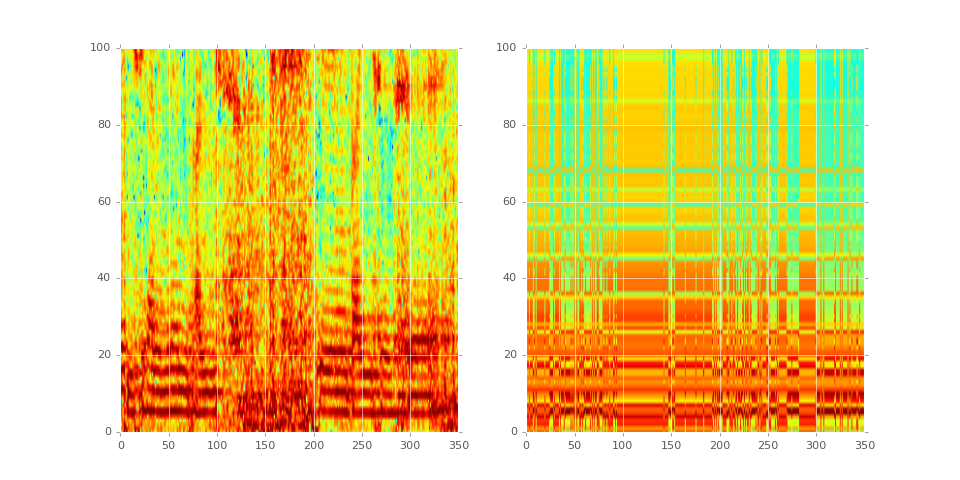

(0, 100)

In [218]:
range_ = range(50,400)
original = data.data[range_]
out = sess.run(y_pred, feed_dict={X: original})

figure(figsize=(12,6))
subplot(1,2,1)
imshow((original*Sd+Smean).T,aspect='auto',origin='bottom')
ylim(0,100)

subplot(1,2,2)
imshow((out*Sd+Smean).T,aspect='auto',origin='bottom')
ylim(0,100)


<IPython.core.display.Javascript object>


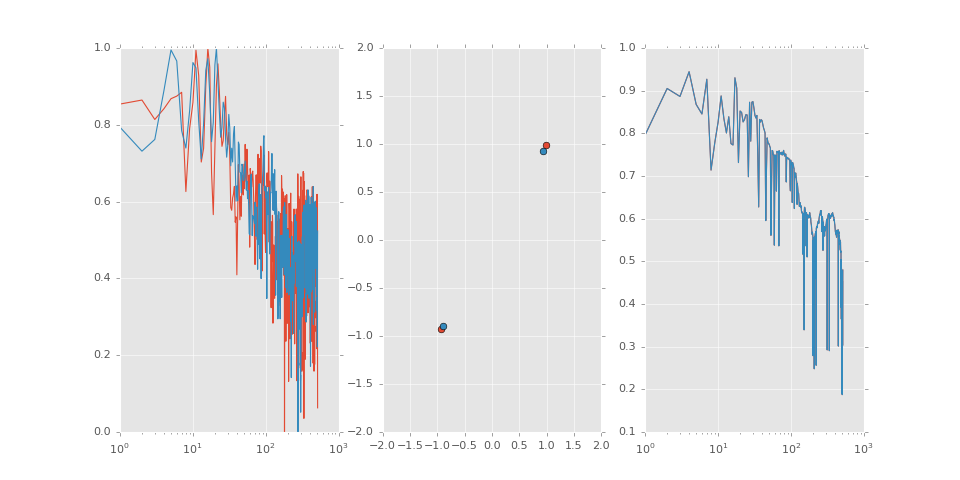

In [219]:
inputs = [data.data[50:51],data.data[100:101]]

figure(figsize=(12,6))
for i,input_ in enumerate(inputs):
#     figure(figsize=(12,6))
    subplot(1,3,1)
    semilogx( (input_*Sd+Smean).T )  
    middle,out = sess.run([encoder_op,y_pred], feed_dict={X: input_})
    subplot(1,3,2)
    plot(middle[0],middle[0],'o')
    xlim(-2,2)
    ylim(-2,2)
    subplot(1,3,3)
    semilogx( (out*Sd+Smean).T )


<IPython.core.display.Javascript object>


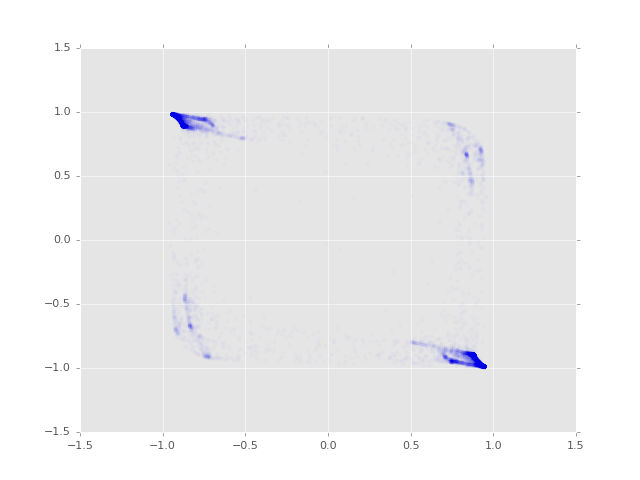

[-1.5, 1.5, -1.5, 1.5]

In [223]:
middle,out = sess.run([encoder_op,y_pred], feed_dict={X: data.data})
figure()
plot(middle[:,0],middle[:,1],'.b',alpha=0.01)
axis([-1.5,1.5,-1.5,1.5])


<IPython.core.display.Javascript object>


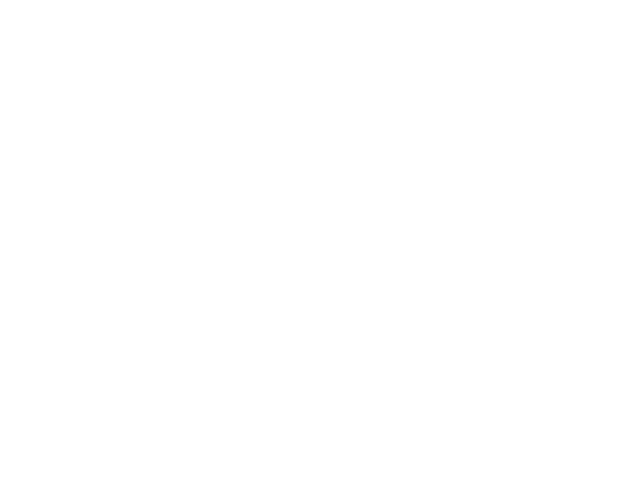

NameError: name 'sd' is not defined

In [222]:
out = sess.run([y_pred], feed_dict={encoder_op: [[0.2,0.9]]})
figure()
plot( (out[0]*sd+Smean).T )

In [ ]:
data.data.shape